In [3]:
import matplotlib.pyplot as plt
import rasterio
from rasterio.transform import from_origin
from pyproj import Transformer
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import geopandas as gpd


import os, sys
import folium
import cartopy.io.img_tiles as cimgt
import cartopy.crs as ccrs
import folium.raster_layers
import folium.features
import folium.plugins
import folium.map

sys.path.append('script')
from utils import add_polygon_layer, add_gedi_agbd_layer, GEDIdata, add_s1_tree_layer
# sys.modules.pop('utils', None)


In [2]:
sys.modules.pop('utils', None)

<module 'utils' from '/Volumes/siyux1927/thesis/script/utils.py'>

## Biomassters Visualization

The original publication of the biomassters competition and datasets could be found [here](https://nascetti-a.github.io/BioMasster/). And also some [descriptions of the data](https://drivendata.co/images/competition-biomass-benchmark.html).

But there is no geo reference, we only know approximately that it's located within Finland's borders.


In [4]:
AGBM_PATH = 'data/biomassters/test_agbm'
S2_PATH = 'data/biomassters/test_features/s2'
S1_PATH = 'data/biomassters/test_features/s1'
s2_files = os.listdir(S2_PATH)
s1_files = os.listdir(S1_PATH)

band_names = ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12']

In [34]:
# Let's pick a sample image from the S1 directory and print its CRS
sample_s1_file = os.path.join(S1_PATH, s1_files[0])
print(f"S1 file: {sample_s1_file}")

# Open the file with rasterio and print its CRS information
with rasterio.open(sample_s1_file) as src:
    band = src.read(1)
    print(f"CRS: {src.crs}")
    print(f"Bounds: {src.bounds}")
    print(f"Shape: {src.shape}")
    print(f"Number of bands: {src.count}")
    print(f"Transform: {src.transform}")
    print(f"Resolution: {src.res}")
    print(f"Nodata value: {src.nodata}")
    print(f"Band: {band}") # DB transform

# Also check the same information for an S2 image
sample_s2_file = os.path.join(S2_PATH, s2_files[0])
print(f"\nS2 file: {sample_s2_file}")

# Open the S2 file with rasterio and print its CRS information
with rasterio.open(sample_s2_file) as src:
    print(f"CRS: {src.crs}")
    print(f"Bounds: {src.bounds}")
    print(f"Shape: {src.shape}")
    print(f"Number of bands: {src.count}")
    print(f"Transform: {src.transform}")
    print(f"Resolution: {src.res}")
    print(f"Nodata value: {src.nodata}")

# Check TreeSat S1 data
treesat_s1_file = 'data/biomassters/test_agbm/0a2d4cec_agbm.tif'
print(f"\nAGBM file: {treesat_s1_file}")


S1 file: data/biomassters/test_features/s1/dd5f7e71_S1_05.tif
CRS: None
Bounds: BoundingBox(left=0.0, bottom=256.0, right=256.0, top=0.0)
Shape: (256, 256)
Number of bands: 4
Transform: | 1.00, 0.00, 0.00|
| 0.00, 1.00, 0.00|
| 0.00, 0.00, 1.00|
Resolution: (1.0, 1.0)
Nodata value: None
Band: [[ -8.888466  -8.717257  -9.143555 ... -12.933325 -12.506265 -13.409091]
 [ -9.025847  -8.566579  -9.311859 ... -12.169018 -11.777112 -12.520917]
 [ -9.293154  -8.617193  -9.270196 ... -12.229842 -12.69978  -13.180508]
 ...
 [-10.291048 -10.296434 -11.294317 ... -15.603618 -15.417995 -16.093   ]
 [-10.428995 -10.485114 -10.567396 ... -15.767509 -15.468168 -16.296888]
 [-10.214303 -10.398839  -9.748352 ... -15.071405 -14.650929 -14.587325]]

S2 file: data/biomassters/test_features/s2/dd3dbeb9_S2_10.tif
CRS: None
Bounds: BoundingBox(left=0.0, bottom=256.0, right=256.0, top=0.0)
Shape: (256, 256)
Number of bands: 11
Transform: | 1.00, 0.00, 0.00|
| 0.00, 1.00, 0.00|
| 0.00, 0.00, 1.00|
Resolution: (1

Visualizing S1 file: data/biomassters/test_features/s1/dd5f7e71_S1_05.tif


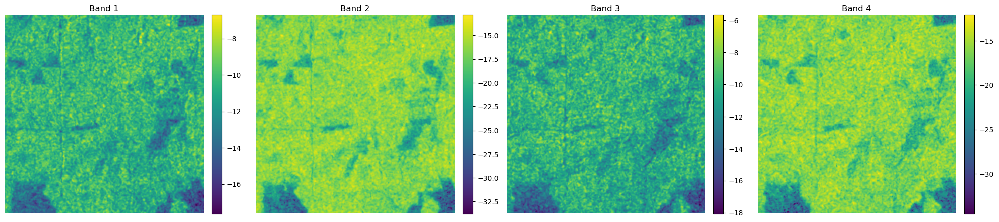

In [35]:
# Visualize the four bands of a Sentinel-1 image in a row
def visualize_s1_bands():
    # Select a sample S1 file
    sample_s1_file = os.path.join(S1_PATH, s1_files[0])
    print(f"Visualizing S1 file: {sample_s1_file}")
    
    # Open the file with rasterio
    with rasterio.open(sample_s1_file) as src:
        # Create a figure with 4 subplots in a row
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        
        # Read and display each band
        for i in range(src.count):
            band = src.read(i+1)
            
            
            # Plot the band
            im = axes[i].imshow(band, cmap='viridis')
            axes[i].set_title(f'Band {i+1}')
            axes[i].axis('off')
            
            # Add colorbar
            plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.04)
        
        plt.tight_layout()
        plt.show()

# Call the function to visualize S1 bands
visualize_s1_bands()


In [25]:
import rioxarray
lvis_ds_rh98_r = rioxarray.open_rasterio(sample_s1_file, masked=True)
print(f"meta: {lvis_ds_rh98_r}")
print(f"ref: {lvis_ds_rh98_r.spatial_ref}")

meta: <xarray.DataArray (band: 4, y: 256, x: 256)> Size: 1MB
[262144 values with dtype=float32]
Coordinates:
  * band         (band) int64 32B 1 2 3 4
  * x            (x) float64 2kB 0.5 1.5 2.5 3.5 4.5 ... 252.5 253.5 254.5 255.5
  * y            (y) float64 2kB 0.5 1.5 2.5 3.5 4.5 ... 252.5 253.5 254.5 255.5
    spatial_ref  int64 8B 0
Attributes:
    scale_factor:  1.0
    add_offset:    0.0
ref: <xarray.DataArray 'spatial_ref' ()> Size: 8B
array(0)
Coordinates:
    spatial_ref  int64 8B 0
Attributes:
    GeoTransform:  0.0 1.0 0.0 0.0 0.0 1.0


/Users/siyux1927/.micromamba/envs/new/lib/python3.12/site-packages/rioxarray/_io.py:1143: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore


In [16]:
# Let's pick a sample image from the S1 directory and print its CRS
sample_s1_file = os.path.join(S1_PATH, s1_files[0])
print(f"S1 file: {sample_s1_file}")

# Open the file with rasterio and print its CRS information
with rasterio.open(sample_s1_file) as src:
    print(f"CRS: {src.crs}")
    print(f"Bounds: {src.bounds}")
    print(f"Shape: {src.shape}")
    print(f"Number of bands: {src.count}")
    print(f"Transform: {src.transform}")
    print(f"Resolution: {src.res}")
    print(f"Nodata value: {src.nodata}")


S1 file: data/biomassters/test_features/s1/dd5f7e71_S1_05.tif
CRS: None
Bounds: BoundingBox(left=0.0, bottom=256.0, right=256.0, top=0.0)
Shape: (256, 256)
Number of bands: 4
Transform: | 1.00, 0.00, 0.00|
| 0.00, 1.00, 0.00|
| 0.00, 0.00, 1.00|
Resolution: (1.0, 1.0)
Nodata value: None


The reference images are in the `test_agbm`. The features are distributed across the `test` and `train` folders, containing:
- Sentinel-1 images with 4 bands
- Sentinel-2 images with 10 bands


Processing file: data/biomassters/test_features/s2/de9f8e47_S2_10.tif
Processing file: data/biomassters/test_features/s2/dec410ad_S2_10.tif
Processing file: data/biomassters/test_features/s2/decc89bb_S2_10.tif
Processing file: data/biomassters/test_features/s2/ded93bac_S2_10.tif
Processing file: data/biomassters/test_features/s2/dee9a2d7_S2_10.tif


/Users/siyux1927/.micromamba/envs/new/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


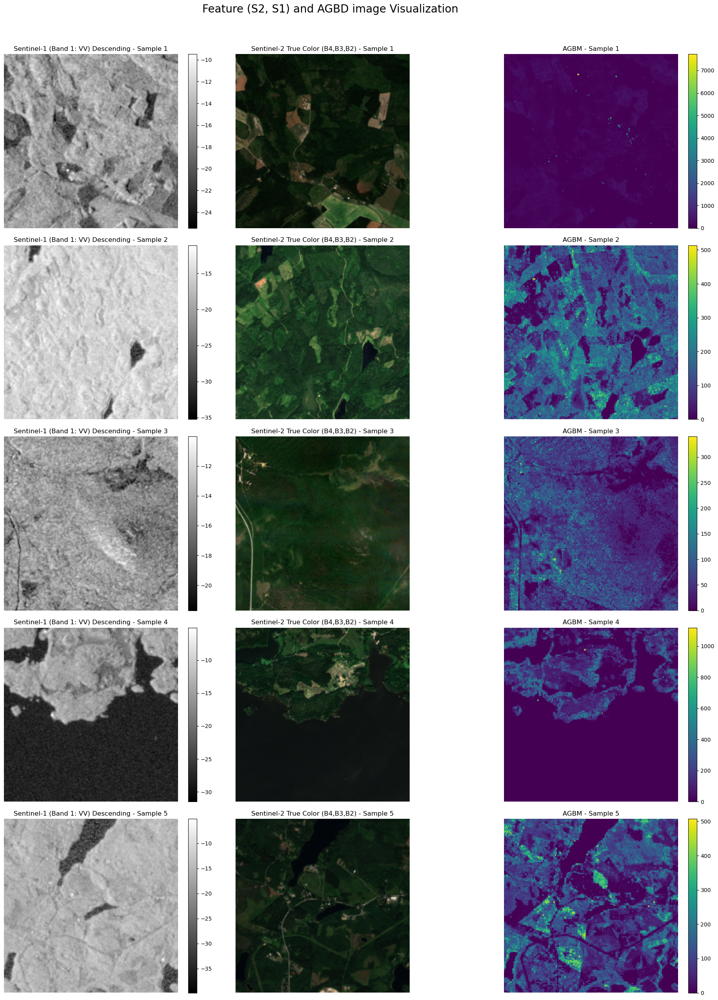

In [47]:

import matplotlib.gridspec as gridspec

def visualize_biomassters():
    bands = {}
    plt.figure(figsize=(20, 25))
    
    # Filter files to only include those ending with '10.tif'
    # Extract chip IDs from filenames
    s2_chip_ids = [f.split('_')[0] for f in s2_files if f.endswith('10.tif')]
    s1_chip_ids = [f.split('_')[0] for f in s1_files if f.endswith('10.tif')]
    
    # Find intersection of chip IDs
    common_chip_ids = set(s2_chip_ids).intersection(set(s1_chip_ids))
    
    # Filter files to only include those with common chip IDs and ending with '10.tif'
    s2_files_filtered = [f for f in s2_files if f.endswith('10.tif') and f.split('_')[0] in common_chip_ids]
    # s2_files_filtered = s2_files_filtered[80:100]
    
    # gs = gridspec.GridSpec(5, 3, width_ratios=[1, 1, 1], wspace=0.05)

    for j in range(5):
        sample_file = os.path.join(S2_PATH, s2_files_filtered[j+20])
        print(f"Processing file: {sample_file}")
        tokens = sample_file.split('/')[-1].split('_')
        sample_agbd_file = os.path.join(AGBM_PATH, f'{tokens[0]}_agbm.tif')
        
        # Find corresponding S1 file
        s1_file_name = f"{tokens[0]}_S1_10.tif"  # Use the file with suffix 10
        s1_file_path = os.path.join(S1_PATH, s1_file_name)
        
        with rasterio.open(sample_file) as src:
            for i, name in enumerate(band_names, 1):
                bands[name] = src.read(i)
            
            # S1 visualization
            ax1 = plt.subplot(5, 3, j*3 + 1)
            with rasterio.open(s1_file_path) as s1_src:
                s1_data = s1_src.read(2)  # Read only the first band
                im1 = ax1.imshow(s1_data, cmap='gray')  # Use grayscale colormap for single band
                ax1.axis('off')
                ax1.set_title(f'Sentinel-1 (Band 1: VV) Descending - Sample {j+1}')
                plt.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)
            
            # True color composite (B4,B3,B2)
            ax2 = plt.subplot(5, 3, j*3 + 2)
            # Process RGB values for better visualization
            rgb = np.dstack((bands['B4'], bands['B3'], bands['B2']))
            # Normalize the RGB values to [0, 1] range
            rgb_norm = (rgb - rgb.min()) / (rgb.max() - rgb.min())
            im2 = ax2.imshow(rgb_norm)
            ax2.axis('off')
            ax2.set_title(f'Sentinel-2 True Color (B4,B3,B2) - Sample {j+1}')

            # AGBM visualization
            ax3 = plt.subplot(5, 3, j*3 + 3)
            with rasterio.open(sample_agbd_file) as src:
                agbm = src.read(1)
                im3 = ax3.imshow(agbm, cmap='viridis')
                ax3.axis('off')
                ax3.set_title(f'AGBM - Sample {j+1}')
                plt.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04)

    plt.suptitle('Feature (S2, S1) and AGBD image Visualization', fontsize=20, y=1.02)
    plt.tight_layout()
    plt.show()

visualize_biomassters()

In [5]:
metadata_features_df = pd.read_csv('data/biomassters/The_BioMassters_-_features_metadata.csv.csv')
print("First few rows of the metadata:")
display(metadata_features_df.head())

metadata_agbm_df = pd.read_csv('data/biomassters/The_BioMassters_-_train_agbm_metadata.csv.csv')
print("First few rows of the metadata:")
display(metadata_agbm_df.head())

First few rows of the metadata:


,filename,chip_id,satellite,split,month,size,cksum,s3path_us,s3path_eu,s3path_as,corresponding_agbm
0,0003d2eb_S1_00.tif,0003d2eb,S1,train,September,1049524,3953454613,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,0003d2eb_agbm.tif
1,0003d2eb_S1_01.tif,0003d2eb,S1,train,October,1049524,3531005382,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,0003d2eb_agbm.tif
2,0003d2eb_S1_02.tif,0003d2eb,S1,train,November,1049524,1401197002,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,0003d2eb_agbm.tif
3,0003d2eb_S1_03.tif,0003d2eb,S1,train,December,1049524,3253084255,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,0003d2eb_agbm.tif
4,0003d2eb_S1_04.tif,0003d2eb,S1,train,January,1049524,2467836265,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,0003d2eb_agbm.tif


First few rows of the metadata:


,filename,chip_id,size,cksum,s3path_us,s3path_eu,s3path_as
0,0003d2eb_agbm.tif,0003d2eb,262482,2036246549,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...
1,000aa810_agbm.tif,000aa810,262482,2858468457,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...
2,000d7e33_agbm.tif,000d7e33,262482,277850822,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...
3,00184691_agbm.tif,00184691,262482,3502312579,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...
4,001b0634_agbm.tif,001b0634,262482,2397957274,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...,s3://drivendata-competition-biomassters-public...


In [31]:
# Count the number of train and test samples for S1 satellite in the metadata
s1_counts = metadata_features_df[metadata_features_df['satellite'] == 'S1']['split'].value_counts()

print("S1 satellite data distribution:")
print(f"Train samples: {s1_counts.get('train', 0)}")
print(f"Test samples: {s1_counts.get('test', 0)}")
print(f"Total S1 samples: {metadata_features_df[metadata_features_df['satellite'] == 'S1'].shape[0]}")


# Count files in test_features/s1 directory
s1_test_features_count = len([f for f in os.listdir('data/biomassters/test_features/s1') if f.endswith('.tif')])
print(f"\nNumber of files in test_features/s1: {s1_test_features_count}")

# Count files in test_agbm directory
test_agbm_count = len([f for f in os.listdir('data/biomassters/test_agbm') if f.endswith('.tif')])
print(f"Number of files in test_agbm: {test_agbm_count}")


S1 satellite data distribution:
Train samples: 104268
Test samples: 33276
Total S1 samples: 137544

Number of files in test_features/s1: 4569
Number of files in test_agbm: 2773


In [32]:
# Count the number of files for each month in the test_features/s1 directory
s1_test_files = [f for f in os.listdir('data/biomassters/test_features/s1') if f.endswith('.tif')]

# Initialize counters for each month suffix
month_counts = {f"{i:02d}": 0 for i in range(12)}

# Count files by month suffix
for file in s1_test_files:
    for suffix in month_counts.keys():
        if file.endswith(f"_{suffix}.tif"):
            month_counts[suffix] += 1

# Display the results
print("Number of S1 test files by month:")
for suffix, count in month_counts.items():
    print(f"Month {suffix}: {count} files")

# Total count
total_files = sum(month_counts.values())
print(f"\nTotal S1 test files: {total_files}")


Number of S1 test files by month:
Month 00: 381 files
Month 01: 381 files
Month 02: 381 files
Month 03: 380 files
Month 04: 380 files
Month 05: 381 files
Month 06: 380 files
Month 07: 381 files
Month 08: 381 files
Month 09: 381 files
Month 10: 381 files
Month 11: 381 files

Total S1 test files: 4569


Visualize some images in RGB

/Users/siyux1927/.micromamba/envs/new/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


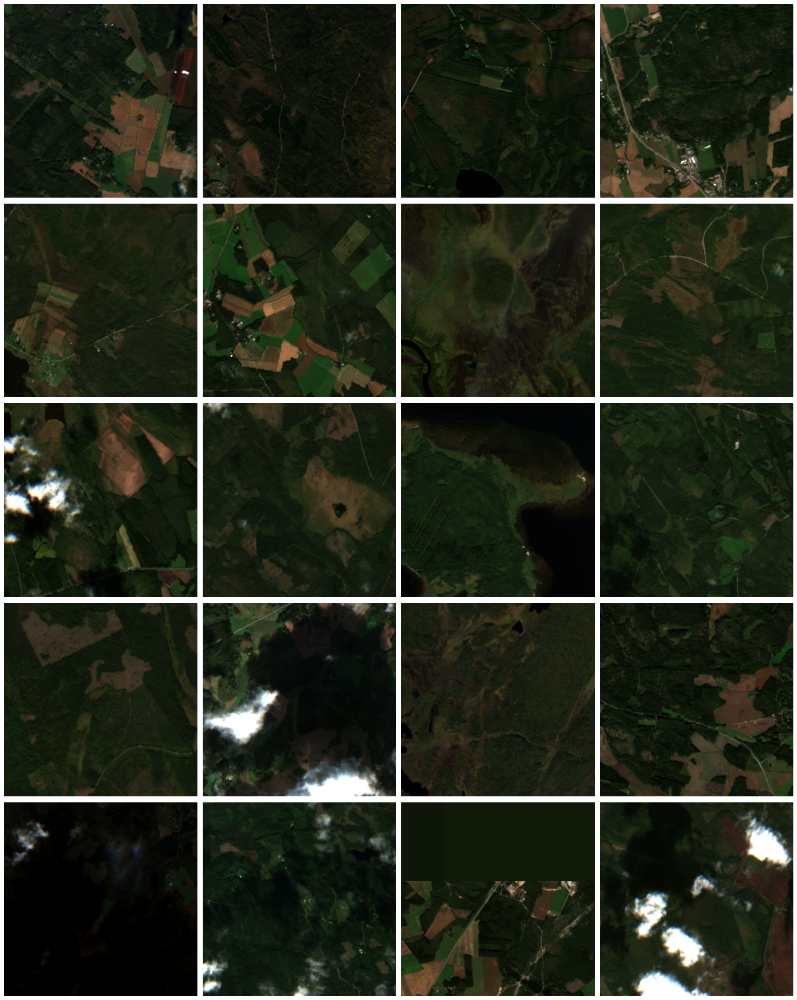

In [78]:
def visualize_s2_images():
    sample_s2_files = [f for f in os.listdir('data/biomassters/test_features/s2') if f.endswith('00.tif')][80:100]
    fig, axes = plt.subplots(5, 4, figsize=(20, 25))
    axes = axes.ravel()

    for idx, s2_file in enumerate(sample_s2_files):
        file_path = os.path.join('data/biomassters/test_features/s2', s2_file)
        
        with rasterio.open(file_path) as src:
            # Read RGB bands (assuming bands 4,3,2 are RGB)
            rgb = np.dstack([src.read(3), src.read(2), src.read(1)])
            # Normalize the RGB values
            rgb = np.clip(rgb / 3000, 0, 1)
            
            axes[idx].imshow(rgb)
            axes[idx].axis('off')

    plt.tight_layout()
    plt.show()

visualize_s2_images()

In [79]:
del metadata_features_df, metadata_agbm_df

## TreeSat & Gedi Visualization

TreeSat S1 images have a resolution of 6x6 pixels, with each pixel representing 10m. They use the EPSG:25832 coordinate system. For consistency, we'll transform these coordinates to a standard format in the following code.


In [48]:
# Read the GeoJSON file into a GeoDataFrame
gdf = gpd.read_file('data/treesat/bb_60m.GeoJSON')

# Get first 4 points of each polygon
gdf["utm_x1"] = gdf.geometry.apply(lambda x: list(x.exterior.coords)[0][0])
gdf["utm_y1"] = gdf.geometry.apply(lambda x: list(x.exterior.coords)[0][1])
gdf["utm_x2"] = gdf.geometry.apply(lambda x: list(x.exterior.coords)[1][0]) 
gdf["utm_y2"] = gdf.geometry.apply(lambda x: list(x.exterior.coords)[1][1])
gdf["utm_x3"] = gdf.geometry.apply(lambda x: list(x.exterior.coords)[2][0])
gdf["utm_y3"] = gdf.geometry.apply(lambda x: list(x.exterior.coords)[2][1])
gdf["utm_x4"] = gdf.geometry.apply(lambda x: list(x.exterior.coords)[3][0])
gdf["utm_y4"] = gdf.geometry.apply(lambda x: list(x.exterior.coords)[3][1])

# Transform all coordinates to WGS84
transformer = Transformer.from_crs("EPSG:25832", "EPSG:4326", always_xy=True)
gdf["lon1"], gdf["lat1"] = transformer.transform(gdf["utm_x1"].values, gdf["utm_y1"].values)
gdf["lon2"], gdf["lat2"] = transformer.transform(gdf["utm_x2"].values, gdf["utm_y2"].values)
gdf["lon3"], gdf["lat3"] = transformer.transform(gdf["utm_x3"].values, gdf["utm_y3"].values)
gdf["lon4"], gdf["lat4"] = transformer.transform(gdf["utm_x4"].values, gdf["utm_y4"].values)

df = gdf.copy()
df.head()
df

,IMG_ID,ID,BT_DEU,BT_ENG,BT_BOT,BT_GEN,AKL,SOURCE,l0,l1,...,utm_x4,utm_y4,lon1,lat1,lon2,lat2,lon3,lat3,lon4,lat4
0,Fagus_sylvatica_7_138225_BI_NLF,138225,Bu,European beech,Fagus sylvatica,Fagus,7,BI_NLF,forest,broadleaf,...,579864.958952,5.756766e+06,10.163116,51.955843,10.163102,51.955296,10.162217,51.955305,10.162231,51.955851
1,Fagus_sylvatica_7_138342_BI_NLF,138342,Bu,European beech,Fagus sylvatica,Fagus,7,BI_NLF,forest,broadleaf,...,579764.999894,5.756866e+06,10.161685,51.956756,10.161671,51.956209,10.160786,51.956218,10.160800,51.956764
2,Fagus_sylvatica_7_138464_BI_NLF,138464,Bu,European beech,Fagus sylvatica,Fagus,7,BI_NLF,forest,broadleaf,...,579665.040836,5.756966e+06,10.160254,51.957669,10.160239,51.957122,10.159355,51.957131,10.159369,51.957677
3,Picea_abies_4_138466_BI_NLF,138466,Fi,Spruce,Picea abies,Picea,4,BI_NLF,forest,needleleaf,...,579864.960762,5.756966e+06,10.163162,51.957640,10.163148,51.957093,10.162264,51.957102,10.162278,51.957649
4,Acer_pseudoplatanus_7_138484_BI_NLF,138484,BAh,Sycamore maple,Acer pseudoplatanus,Acer,7,BI_NLF,forest,broadleaf,...,599457.113256,5.756966e+06,10.448199,51.954477,10.448181,51.953931,10.447297,51.953942,10.447314,51.954488
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50376,Tilia_spec._9_99911_WEFL_NLF,99911,Li,Linden,Tilia spec.,Tilia,9,WEFL_NLF,forest,broadleaf,...,600919.222777,5.807209e+06,10.484430,52.405787,10.484411,52.405241,10.483518,52.405252,10.483536,52.405798
50377,Tilia_spec._3_99951_WEFL_NLF,99951,Li,Linden,Tilia spec.,Tilia,3,WEFL_NLF,forest,broadleaf,...,599317.783213,5.781615e+06,10.453347,52.176050,10.453329,52.175504,10.452441,52.175515,10.452458,52.176061
50378,Tilia_spec._4_99957_WEFL_NLF,99957,Li,Linden,Tilia spec.,Tilia,4,WEFL_NLF,forest,broadleaf,...,611545.704293,5.788996e+06,10.634531,52.240047,10.634511,52.239500,10.633621,52.239513,10.633641,52.240059
50379,Tilia_spec._4_99969_WEFL_NLF,99969,Li,Linden,Tilia spec.,Tilia,4,WEFL_NLF,forest,broadleaf,...,589527.051291,5.774453e+06,10.308319,52.113350,10.308303,52.112803,10.307415,52.112813,10.307431,52.113360


### Visualize in vast area
s1 data is download from [EO browser](https://apps.sentinel-hub.com/eo-browser/?zoom=10&lat=41.9&lng=12.5&themeId=DEFAULT-THEME&toTime=2025-04-15T17%3A39%3A17.176Z) with downsampled resolution intending for quicker visualization. File is saved as tiff with 2 bands of VV and VH in folder 'data/s1_raw20250406'.

GEDI L4A [here](https://daac.ornl.gov/GEDI/guides/GEDI_L4A_AGB_Density_V2_1.html).

In [49]:
# load s1 background data
with rasterio.open('data/s1_raw20250406/2025-04-06-00:00_2025-04-06-23:59_Sentinel-1_AWS-IW-VVVH_VV_(Raw).tiff') as src:
    s1_data = src.read(1)
    s1_bounds = src.bounds
    # Create image overlay for S1 data
    s1_data_normalized = (s1_data - s1_data.min()) / (s1_data.max() - s1_data.min()) * 255
    s1_data_normalized = s1_data_normalized.astype(np.uint8)
    print(src.res)

(0.0021621092000000002, 0.0013142025595763468)


In [51]:
with rasterio.open('data/treesat/s1/60m/Abies_alba_0_2545_WEFL_NLF.tif') as src:
    print(src.res)
    print(src.crs)
    print(src.bounds)
    print(src.shape)
    print(src.count)
    print(src.dtypes)
    print(src.nodata)
    print(src.transform)

(10.0, 10.0)
EPSG:32632
BoundingBox(left=552245.0, bottom=5728155.0, right=552305.0, top=5728215.0)
(6, 6)
3
('float32', 'float32', 'float32')
-9999.0
| 10.00, 0.00, 552245.00|
| 0.00,-10.00, 5728215.00|
| 0.00, 0.00, 1.00|


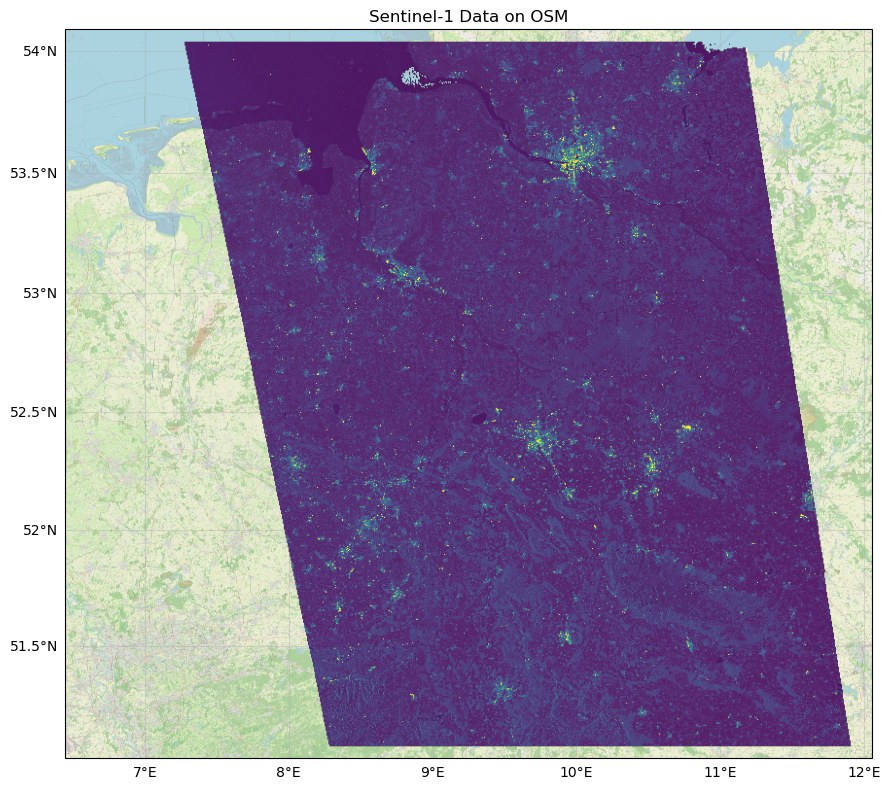

In [9]:
def visualize_s1_background():
# Create figure and axis with OSM projection
    osm = cimgt.OSM()
    fig = plt.figure(figsize=(10, 8))
    ax = plt.axes(projection=osm.crs)

    # Set map extent
    ax.set_extent([s1_bounds.left-0.1, s1_bounds.right+0.1,
        s1_bounds.bottom-0.05, s1_bounds.top+0.05])

    # Add OSM tiles with low transparency
    ax.add_image(osm, 12, alpha=1)

    # Plot S1 data with transparency
    s1_masked = np.ma.masked_where(s1_data == 0, s1_data)
    ax.imshow(s1_masked, cmap='viridis', alpha=0.9,  # Reduced alpha for better visibility
        extent=[s1_bounds.left, s1_bounds.right,
                s1_bounds.bottom, s1_bounds.top],
        transform=ccrs.PlateCarree(),
        zorder=10)
    
    gl = ax.gridlines(draw_labels=True, alpha=0.4)
    gl.top_labels = False
    gl.right_labels = False
    ax.set_title('Sentinel-1 Data on OSM')

    plt.tight_layout()
    plt.show()

visualize_s1_background()

In [10]:
# load gedi agbd data
GEDI_PATH = 'data/gedi/src'
gedi_agbd = GEDIdata('agbd', GEDI_PATH)

unique data points: (1595864, 4)
valid data points: (772945, 5)
====== GEDI data: agbd ======
total data points: (772945, 5)
example:
         lat       lon       feat      beam  id
0  51.429290  9.287851  24.366447  BEAM0000   0
1  51.429360  9.288666  24.130457  BEAM0000   1
2  51.461086  9.664649  27.810642  BEAM0000   2
3  51.462895  9.686668  23.905678  BEAM0000   3
4  51.463435  9.693211  25.016619  BEAM0000   4


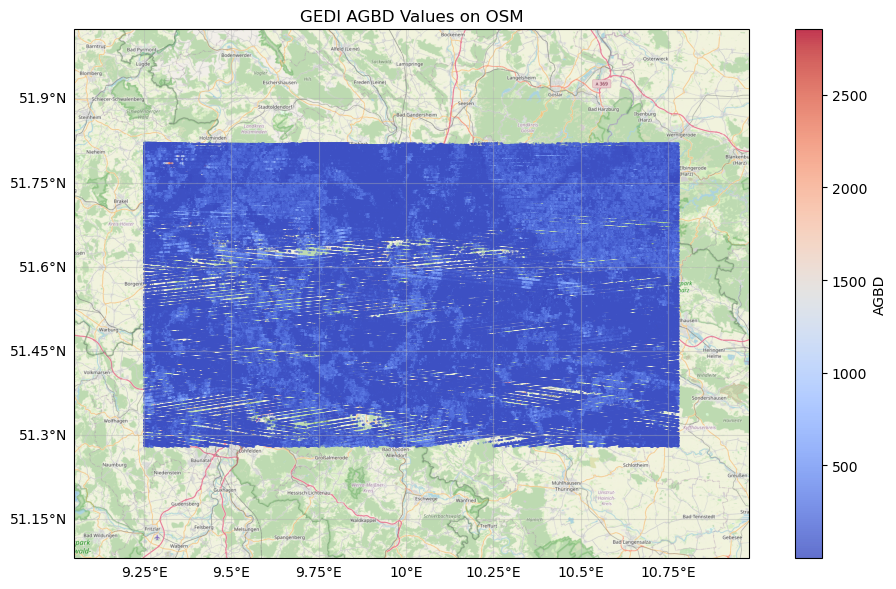

In [11]:
def visualize_gedi_agbd():
    lat = gedi_agbd.df_valid['lat']
    lon = gedi_agbd.df_valid['lon']
    feat = gedi_agbd.df_valid['feat']

    # Create figure and axis with OSM projection
    osm = cimgt.OSM()
    fig = plt.figure(figsize=(10, 6))
    ax = plt.axes(projection=osm.crs)

    # Set map extent with a small buffer
    buffer = 0.2
    ax.set_extent([lon.min()-buffer, lon.max()+buffer, 
                lat.min()-buffer, lat.max()+buffer])

    # Add OSM tiles as background
    ax.add_image(osm, 10, alpha=1)

    # Plot GEDI data points
    scatter = ax.scatter(lon, lat, c=feat, s=0.1, cmap='coolwarm', 
                        norm=plt.Normalize(vmin=feat.min(), vmax=feat.max()),
                        transform=ccrs.PlateCarree(), alpha=0.8)

    # Add colorbar
    cbar = plt.colorbar(scatter, label='AGBD')

    # Add gridlines
    gl = ax.gridlines(draw_labels=True, alpha=0.4)
    gl.top_labels = False
    gl.right_labels = False

    plt.title('GEDI AGBD Values on OSM')
    plt.tight_layout()
    plt.show()

visualize_gedi_agbd()

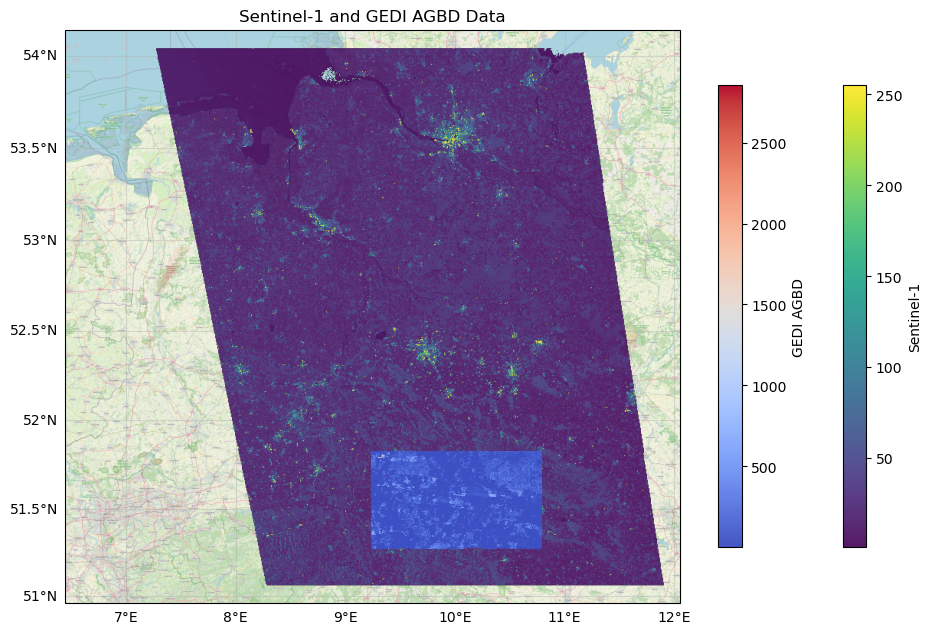

In [12]:
def visualize_combined_map():
    lat = gedi_agbd.df_valid['lat']
    lon = gedi_agbd.df_valid['lon']
    feat = gedi_agbd.df_valid['feat']

    # Create figure and axis with OSM projection
    osm = cimgt.OSM()
    fig = plt.figure(figsize=(10, 8))
    ax = plt.axes(projection=osm.crs)

    # Set map extent with a buffer that includes both datasets
    buffer = 0.1
    ax.set_extent([min(lon.min(), s1_bounds.left) - buffer, 
                  max(lon.max(), s1_bounds.right) + buffer,
                  min(lat.min(), s1_bounds.bottom) - buffer, 
                  max(lat.max(), s1_bounds.top) + buffer])

    # Add OSM tiles as background
    ax.add_image(osm, 10, alpha=1)

    # Plot S1 data with transparency
    s1_masked = np.ma.masked_where(s1_data == 0, s1_data)
    s1_img = ax.imshow(s1_masked, cmap='viridis', alpha=0.9,
                     extent=[s1_bounds.left, s1_bounds.right,
                             s1_bounds.bottom, s1_bounds.top],
                     transform=ccrs.PlateCarree(),
                     zorder=10)

    # Plot GEDI data points on top
    scatter = ax.scatter(lon, lat, c=feat, s=0.5, cmap='coolwarm', 
                        norm=plt.Normalize(vmin=feat.min(), vmax=feat.max()),
                        transform=ccrs.PlateCarree(), alpha=0.95,
                        zorder=20)

    # Add colorbars
    plt.colorbar(s1_img, label='Sentinel-1', pad=0.01, shrink=0.6, ax=ax)
    plt.colorbar(scatter, label='GEDI AGBD', pad=0.05, shrink=0.6, ax=ax)

    # Add gridlines
    gl = ax.gridlines(draw_labels=True, alpha=0.4)
    gl.top_labels = False
    gl.right_labels = False

    plt.title('Sentinel-1 and GEDI AGBD Data')
    plt.tight_layout()
    plt.show()

visualize_combined_map()


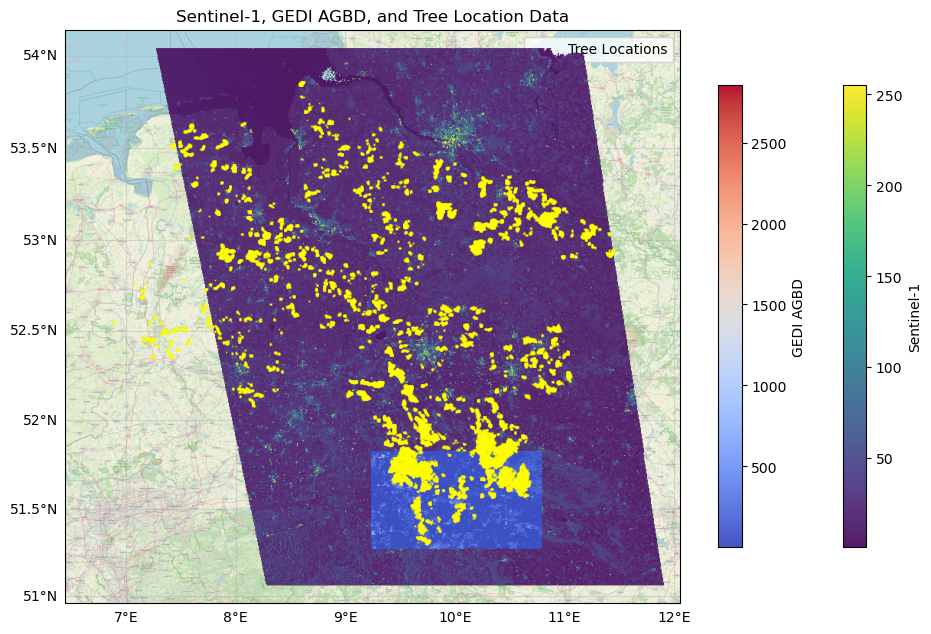

In [13]:
def visualize_combined_map():
    lat = gedi_agbd.df_valid['lat']
    lon = gedi_agbd.df_valid['lon']
    feat = gedi_agbd.df_valid['feat']

    # Create figure and axis with OSM projection
    osm = cimgt.OSM()
    fig = plt.figure(figsize=(10, 8))
    ax = plt.axes(projection=osm.crs)

    # Set map extent with a buffer that includes both datasets
    buffer = 0.1
    ax.set_extent([min(lon.min(), s1_bounds.left) - buffer, 
                  max(lon.max(), s1_bounds.right) + buffer,
                  min(lat.min(), s1_bounds.bottom) - buffer, 
                  max(lat.max(), s1_bounds.top) + buffer])

    # Add OSM tiles as background
    ax.add_image(osm, 10, alpha=1)

    # Plot S1 data with transparency
    s1_masked = np.ma.masked_where(s1_data == 0, s1_data)
    s1_img = ax.imshow(s1_masked, cmap='viridis', alpha=0.9,
                     extent=[s1_bounds.left, s1_bounds.right,
                             s1_bounds.bottom, s1_bounds.top],
                     transform=ccrs.PlateCarree(),
                     zorder=10)

    # Plot GEDI data points on top
    scatter = ax.scatter(lon, lat, c=feat, s=0.5, cmap='coolwarm', 
                        norm=plt.Normalize(vmin=feat.min(), vmax=feat.max()),
                        transform=ccrs.PlateCarree(), alpha=0.95,
                        zorder=20)
    
    # Plot gdf points (lon1, lat1) on the map
    tree_scatter = ax.scatter(gdf['lon1'], gdf['lat1'], color='yellow', s=0.1, 
                             marker='x', transform=ccrs.PlateCarree(), 
                             alpha=0.8, zorder=30, label='Tree Locations')

    # Add colorbars
    plt.colorbar(s1_img, label='Sentinel-1', pad=0.01, shrink=0.6, ax=ax)
    plt.colorbar(scatter, label='GEDI AGBD', pad=0.05, shrink=0.6, ax=ax)

    # Add gridlines
    gl = ax.gridlines(draw_labels=True, alpha=0.4)
    gl.top_labels = False
    gl.right_labels = False
    
    # Add legend
    ax.legend(loc='upper right')

    plt.title('Sentinel-1, GEDI AGBD, and Tree Location Data')
    plt.tight_layout()
    plt.show()

visualize_combined_map()


In [14]:
def create_s1_map(s1_bounds):
    # Create a folium map centered on the mean coordinates
    center_lat = (s1_bounds.top + s1_bounds.bottom) / 2
    center_lon = (s1_bounds.left + s1_bounds.right) / 2

    # Define the map bounds to restrict the viewable area
    min_lat, max_lat = s1_bounds.bottom, s1_bounds.top
    min_lon, max_lon = s1_bounds.left, s1_bounds.right

    # Add some padding (10%) to the bounds
    lat_padding = (max_lat - min_lat) * 0.1
    lon_padding = (max_lon - min_lon) * 0.1
    map_bounds = [
        [min_lat - lat_padding, min_lon - lon_padding],  # Southwest corner
        [max_lat + lat_padding, max_lon + lon_padding]   # Northeast corner
    ]

    # Create the map with restricted bounds
    m = folium.Map(
        location=[center_lat, center_lon],
        zoom_start=12,
        max_bounds=True,  # Restrict panning to the bounds
        min_zoom=7,      # Restrict zooming out too far
        max_zoom=18       # Allow zooming in for details
    )
    # Set the maximum bounds for the map
    m.fit_bounds(map_bounds)
    return m

In [15]:
# Get the viridis colormap
viridis = plt.colormaps.get_cmap('viridis')

def create_colormap_array():
    # Use a pre-computed colormap instead of lambda function for each pixel
    n_colors = 256
    colormap_array = np.zeros((n_colors, 4), dtype=np.float32)
    for i in range(n_colors):
        normalized_value = i / 255.0
        rgb = viridis(normalized_value)[:3]
        colormap_array[i] = [*rgb, 0.7]  # RGB with fixed alpha
    return colormap_array
colormap_array = create_colormap_array()
    
# Create a custom colormap function that makes zero values transparent
def custom_colormap(x):
    if x == 0:
        return (0, 0, 0, 0)  # Transparent for zero values
    else:
        return tuple(colormap_array[int(x)])

In [16]:
m = create_s1_map(s1_bounds)

# Add the S1 data overlay to the map
folium.raster_layers.ImageOverlay(
    s1_data_normalized,
    bounds=[[s1_bounds.bottom, s1_bounds.left], [s1_bounds.top, s1_bounds.right]],
    colormap=custom_colormap,
    opacity=1,
    # Add cross-origin attribute to enable hardware acceleration
    cross_origin=True,
    # Add zIndex to control layer order
    zindex=1
).add_to(m)

m = add_polygon_layer(gdf, m)

m = add_gedi_agbd_layer(gedi_agbd, m)

# Add mouse position control to show coordinates when hovering
folium.plugins.MousePosition(
    position='bottomright',
    separator=' | ',
    empty_string='NaN',
    lng_first=True,
    num_digits=6,
    prefix='Coordinates:'
).add_to(m)

folium.LayerControl().add_to(m)

map_path = 'data/map/s1_tree_agbd25m.html'
m.save(map_path)



The map is like (where some points of GEDI fall in the teritory of treesat): \
The original map is data/map/s1_tree_agbd25m.html (open in browser) \
1 GEDI point is approximately upsampled to 25m per pixel
![](../src/img/IMG_A87299509704-1.jpeg)

### Visualize in a small region

In [17]:
# load s1 background data
with rasterio.open('data/s1_raw20250406_sub/2025-04-06-00:00_2025-04-06-23:59_Sentinel-1_AWS-IW-VVVH_VH_(Raw).tiff') as src:
    s1_data = src.read(1)
    s1_bounds = src.bounds
    # Create image overlay for S1 data
    s1_data_normalized = (s1_data - s1_data.min()) / (s1_data.max() - s1_data.min()) * 255
    s1_data_normalized = s1_data_normalized.astype(np.uint8)

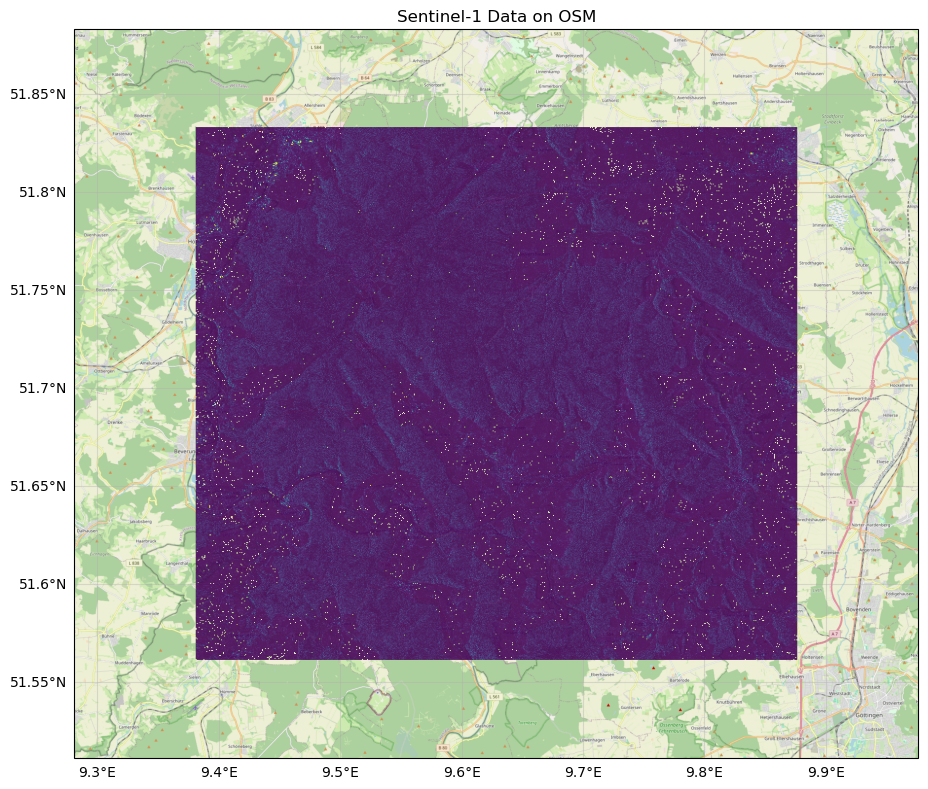

In [18]:
visualize_s1_background()

In [34]:
# Define the bounding box coordinates
bbox = {'left': 9.380951,'bottom': 51.560851,'right': 9.876022,'top': 51.83280}
# Filter points that fall within the bounding box
filtered_df = df[
    (df['lon1'].between(bbox['left'], bbox['right'])) &
    (df['lat1'].between(bbox['bottom'], bbox['top'])) &
    (df['lon2'].between(bbox['left'], bbox['right'])) &
    (df['lat2'].between(bbox['bottom'], bbox['top'])) &
    (df['lon3'].between(bbox['left'], bbox['right'])) &
    (df['lat3'].between(bbox['bottom'], bbox['top'])) &
    (df['lon4'].between(bbox['left'], bbox['right'])) &
    (df['lat4'].between(bbox['bottom'], bbox['top']))
]
s1_files = os.listdir('data/treesat/s1/60m')

In [36]:
m = create_s1_map(s1_bounds)

# Convert to uint8 to reduce memory usage
s1_data_uint8 = (s1_data_normalized).astype(np.uint8)

colormap_array = create_colormap_array()

folium.raster_layers.ImageOverlay(
    s1_data_uint8,
    bounds=[[s1_bounds.bottom, s1_bounds.left], [s1_bounds.top, s1_bounds.right]],
    colormap=lambda x: tuple(colormap_array[int(x)]),
    opacity=1,
    # Add cross-origin attribute to enable hardware acceleration
    cross_origin=True,
    # Add zIndex to control layer order
    zindex=1
).add_to(m)

add_s1_tree_layer(filtered_df, s1_files, m, 3000)

# Add mouse position control to show coordinates when hovering
folium.plugins.MousePosition(
    position='bottomright',
    separator=' | ',
    empty_string='NaN',
    lng_first=True,
    num_digits=6,
    prefix='Coordinates:'
).add_to(m)

folium.LayerControl().add_to(m)

map_path = 'data/map/map_with_tree_s1.html'
m.save(map_path)


![](../src/img/IMG_615A136A9717-1.jpeg)